In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Simulating prediction with confusion matrix
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff


In [2]:
data = pd.read_excel('vital_signs_emotions.xlsx')
data

,ID,Heart Rate,Respiration Rate,Body Temperature,Skin Temperature,Sweat Rate,Heart Rate Variability,Galvanic Skin Response,Oxygen Saturation,Emotional State
0,1,98,16,37.5,35.5,0.176611,77.686178,1.535044,94,Surprise
1,2,111,13,37.2,36.3,0.127912,104.937176,4.827542,92,Surprise
2,3,88,24,37.1,36.6,0.151590,32.859982,1.013438,92,Happy
3,4,74,22,37.2,36.4,0.068462,39.298974,3.395659,97,Sad
4,5,102,20,37.3,35.8,0.191417,36.461972,0.983538,95,Happy
...,...,...,...,...,...,...,...,...,...,...
19995,19996,105,23,37.3,36.8,0.235169,86.090194,2.002042,90,Distress
19996,19997,85,20,37.0,36.4,0.123227,20.059947,0.576398,98,Fear
19997,19998,117,20,36.6,35.9,0.053681,32.992335,1.899898,99,Angry
19998,19999,69,12,37.0,36.6,0.137663,30.943763,1.297255,99,Angry


In [3]:
# Summary statistics for all vital signs
summary_stats = data.describe().transpose()

# Display summary statistics
print(summary_stats)

                          count          mean          std        min  \
ID                      20000.0  10000.500000  5773.647028   1.000000   
Heart Rate              20000.0     89.612150    17.300187  60.000000   
Respiration Rate        20000.0     17.974450     3.752919  12.000000   
Body Temperature        20000.0     37.001115     0.291512  36.500000   
Skin Temperature        20000.0     36.155000     0.377496  35.500000   
Sweat Rate              20000.0      0.175141     0.072473   0.050029   
Heart Rate Variability  20000.0     69.951869    28.801484  20.022890   
Galvanic Skin Response  20000.0      2.600085     1.386512   0.201167   
Oxygen Saturation       20000.0     94.480550     2.868751  90.000000   

                                25%           50%           75%           max  
ID                      5000.750000  10000.500000  15000.250000  20000.000000  
Heart Rate                75.000000     89.000000    105.000000    119.000000  
Respiration Rate          15.

In [4]:
summary_stats.to_csv('summary_stats.csv')

In [5]:
# Group by emotional state and calculate the mean for each vital sign
emotion_group_stats = data.groupby('Emotional State').agg({
    'Heart Rate': 'mean',
    'Respiration Rate': 'mean',
    'Body Temperature': 'mean',
    'Skin Temperature': 'mean',
    'Sweat Rate': 'mean',
    'Heart Rate Variability': 'mean',
    'Galvanic Skin Response': 'mean',
    'Oxygen Saturation': 'mean'
})

In [6]:
# Export to CSV
emotion_group_stats.to_csv('emotion_group_stats.csv')

In [7]:
# Bar chart for mean heart rate by emotional state
# sns.barplot(x='Emotional State', y='Heart Rate', data=data)
# plt.title('Mean Heart Rate by Emotional State')
# plt.show()

In [9]:
# Vital signs vs Emotional State for Heart Rate
# sns.barplot(x='Emotional State', y='Heart Rate', data=data)
# plt.title('Mean Heart Rate Across Emotional States')
# plt.ylabel('Heart Rate (bpm)')
# plt.xlabel('Emotional State')
# plt.xticks(rotation=45)
# plt.show()

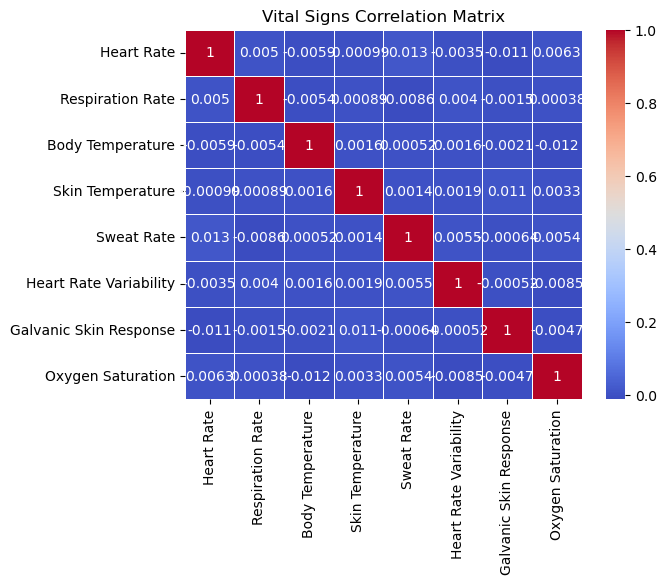

In [10]:
# Correlation matrix
correlation = data[['Heart Rate', 'Respiration Rate', 'Body Temperature', 'Skin Temperature', 'Sweat Rate', 
                    'Heart Rate Variability', 'Galvanic Skin Response', 'Oxygen Saturation']].corr()

# Create heatmap
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Vital Signs Correlation Matrix')
plt.show()

In [11]:
# Create a synthetic time column based on the number of rows
data['Sequence'] = range(1, len(data) + 1)

# Now, let's plot the heart rate and respiration rate using this synthetic sequence.
plt.figure(figsize=(10,6))


<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

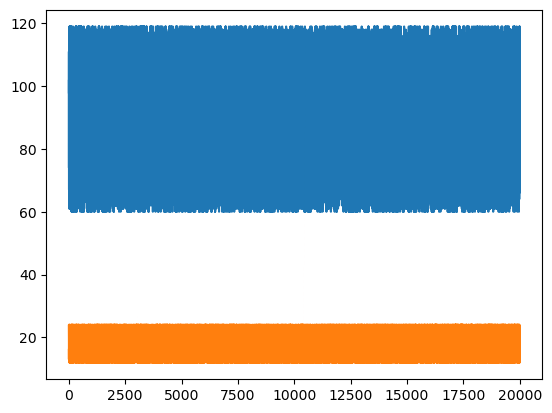

In [12]:
# Plot heart rate and respiration rate with the sequence
plt.plot(data['Sequence'], data['Heart Rate'], label='Heart Rate')
plt.plot(data['Sequence'], data['Respiration Rate'], label='Respiration Rate')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


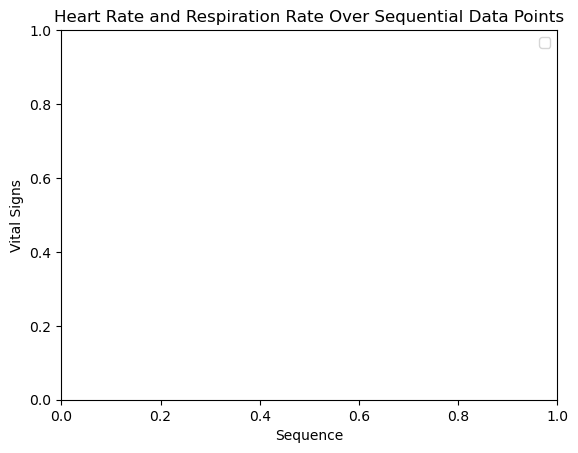

In [13]:
# Adding labels and title
plt.xlabel('Sequence')
plt.ylabel('Vital Signs')
plt.title('Heart Rate and Respiration Rate Over Sequential Data Points')
plt.legend()
plt.show()

In [15]:
# Time series for heart rate over time
# plt.plot(data['sequence'], data['Heart Rate'], label='Heart Rate')
# plt.plot(data['Timestamp'], data['Respiration Rate'], label='Respiration Rate')
# plt.xlabel('Time')
# plt.ylabel('Vital Signs')
# plt.title('Heart Rate and Respiration Rate Over Time')
# plt.legend()
# plt.show()

In [16]:
# Adding variations to vital signs
data['Heart Rate'] = data['Heart Rate'] + np.random.normal(0, 5, len(data))  # Adding noise to heart rate
data['Respiration Rate'] = data['Respiration Rate'] + np.random.normal(0, 2, len(data))  # Adding noise to respiration rate
#data['Blood Pressure'] = data['Blood Pressure'] + np.random.normal(0, 10, len(data))  # Adding noise to blood pressure
data['Body Temperature'] = data['Body Temperature'] + np.random.normal(0, 0.5, len(data))  # Adding noise to temperature
data['Skin Temperature'] = data['Skin Temperature'] + np.random.normal(0, 0.2, len(data))  # Adding slight variability


In [17]:
data

,ID,Heart Rate,Respiration Rate,Body Temperature,Skin Temperature,Sweat Rate,Heart Rate Variability,Galvanic Skin Response,Oxygen Saturation,Emotional State,Sequence
0,1,103.620304,12.426858,38.165062,35.418948,0.176611,77.686178,1.535044,94,Surprise,1
1,2,109.862852,13.313942,37.183176,36.410929,0.127912,104.937176,4.827542,92,Surprise,2
2,3,91.189356,21.140814,37.836453,36.722376,0.151590,32.859982,1.013438,92,Happy,3
3,4,83.811977,21.009437,36.804040,36.207476,0.068462,39.298974,3.395659,97,Sad,4
4,5,107.076277,20.221644,36.387041,35.653466,0.191417,36.461972,0.983538,95,Happy,5
...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,109.929558,27.032694,36.398025,36.649093,0.235169,86.090194,2.002042,90,Distress,19996
19996,19997,82.232210,20.079886,36.947822,36.713926,0.123227,20.059947,0.576398,98,Fear,19997
19997,19998,112.581329,22.266665,36.827048,35.991866,0.053681,32.992335,1.899898,99,Angry,19998
19998,19999,61.744258,11.405148,37.059409,36.714742,0.137663,30.943763,1.297255,99,Angry,19999


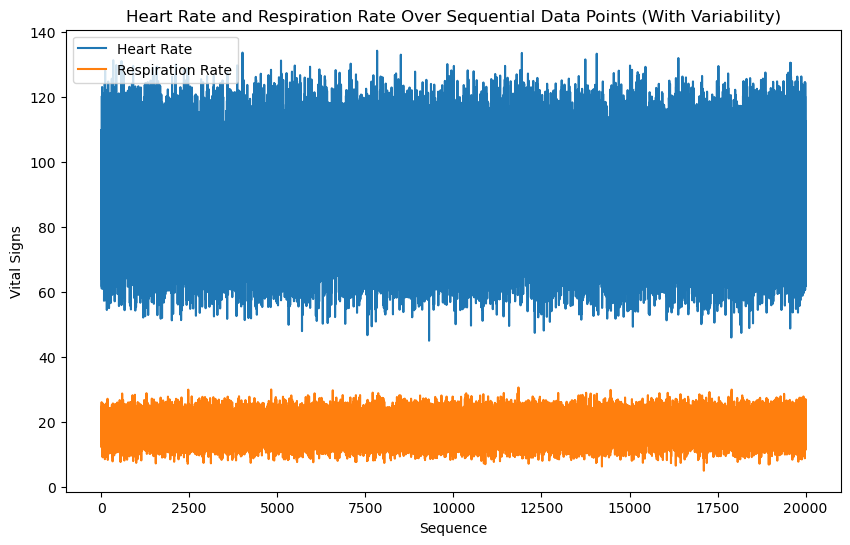

In [18]:
# Visualize heart rate and respiration rate again after adding variability
plt.figure(figsize=(10,6))
plt.plot(data['Sequence'], data['Heart Rate'], label='Heart Rate')
plt.plot(data['Sequence'], data['Respiration Rate'], label='Respiration Rate')

# Adding labels and title
plt.xlabel('Sequence')
plt.ylabel('Vital Signs')
plt.title('Heart Rate and Respiration Rate Over Sequential Data Points (With Variability)')
plt.legend()
plt.show()


In [19]:
# Create artificial emotional states
emotions = ['Neutral', 'Happy', 'Sad', 'Fear', 'Anger', 'Distress']

In [20]:
data


,ID,Heart Rate,Respiration Rate,Body Temperature,Skin Temperature,Sweat Rate,Heart Rate Variability,Galvanic Skin Response,Oxygen Saturation,Emotional State,Sequence
0,1,103.620304,12.426858,38.165062,35.418948,0.176611,77.686178,1.535044,94,Surprise,1
1,2,109.862852,13.313942,37.183176,36.410929,0.127912,104.937176,4.827542,92,Surprise,2
2,3,91.189356,21.140814,37.836453,36.722376,0.151590,32.859982,1.013438,92,Happy,3
3,4,83.811977,21.009437,36.804040,36.207476,0.068462,39.298974,3.395659,97,Sad,4
4,5,107.076277,20.221644,36.387041,35.653466,0.191417,36.461972,0.983538,95,Happy,5
...,...,...,...,...,...,...,...,...,...,...,...
19995,19996,109.929558,27.032694,36.398025,36.649093,0.235169,86.090194,2.002042,90,Distress,19996
19996,19997,82.232210,20.079886,36.947822,36.713926,0.123227,20.059947,0.576398,98,Fear,19997
19997,19998,112.581329,22.266665,36.827048,35.991866,0.053681,32.992335,1.899898,99,Angry,19998
19998,19999,61.744258,11.405148,37.059409,36.714742,0.137663,30.943763,1.297255,99,Angry,19999


In [21]:
# Assign emotions based on sequence (for simplicity)
data['Emotion'] = np.random.choice(emotions, len(data), p=[0.3, 0.15, 0.15, 0.1, 0.1, 0.2])


In [22]:
# Create patterns in vital signs based on emotions
data.loc[data['Emotion'] == 'Stress', 'Heart Rate'] += 10
data.loc[data['Emotion'] == 'Fear', 'Respiration Rate'] += 5
data.loc[data['Emotion'] == 'Anger', 'Body Temperature'] += 15


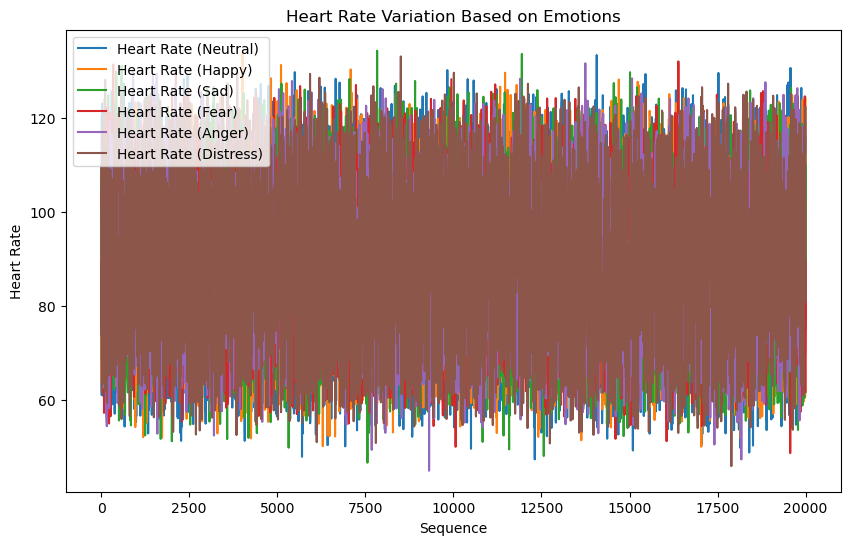

In [23]:
# Now, plot the data after introducing emotions
plt.figure(figsize=(10,6))
for emotion in emotions:
    subset = data[data['Emotion'] == emotion]
    plt.plot(subset['Sequence'], subset['Heart Rate'], label=f'Heart Rate ({emotion})')

plt.xlabel('Sequence')
plt.ylabel('Heart Rate')
plt.title('Heart Rate Variation Based on Emotions')
plt.legend()
plt.show()

# Line Charts with Emotion-Based Coloring

In [24]:
import plotly.express as px

In [25]:
# Line chart showing Heart Rate over time, colored by Emotion
fig = px.line(data, x='Sequence', y='Heart Rate', color='Emotion',
              title="Heart Rate Over Time by Emotional States",
              labels={'Heart Rate':'Heart Rate (bpm)', 'Sequence':'Time (s)'},
              template='plotly_dark')

# Customize the layout
fig.update_layout(
    title_font=dict(size=24, family='Arial'),
    xaxis_title='Sequence of Time (s)',
    yaxis_title='Heart Rate (bpm)',
    legend_title_text='Emotion',
    hovermode='x'
)

fig.show()

# Heatmap for Correlations between Vital Signs

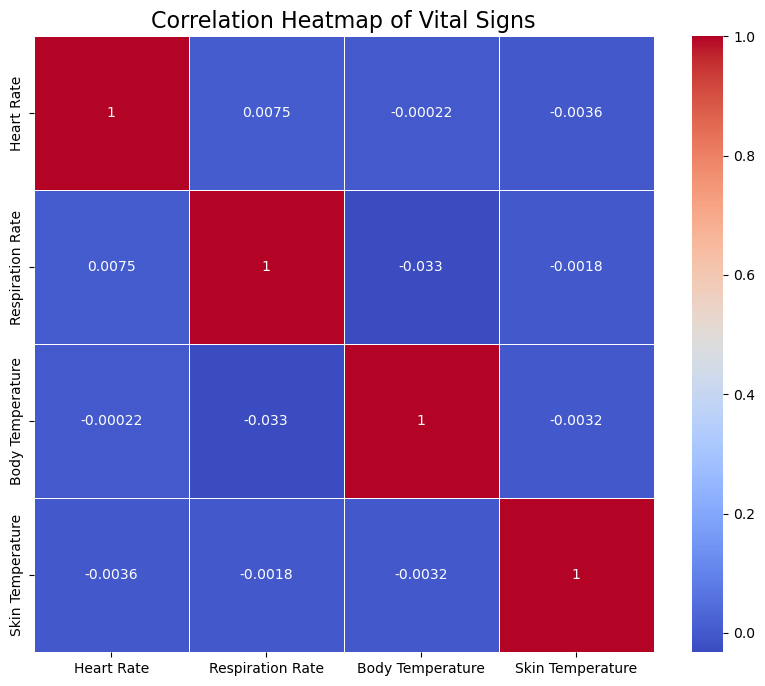

In [26]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = data[['Heart Rate', 'Respiration Rate', 'Body Temperature', 'Skin Temperature']].corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Vital Signs", fontsize=16)
plt.show()

# Box Plots to Show Distribution of Vital Signs by Emotion

In [27]:
fig = px.box(data, x='Emotion', y='Heart Rate', color='Emotion', 
             title="Distribution of Heart Rate by Emotional States", 
             template='plotly_white')

fig.update_layout(
    title_font=dict(size=22, family='Helvetica'),
    yaxis_title='Heart Rate (bpm)',
    xaxis_title='Emotion',
    legend_title_text='Emotion'
)

fig.show()

# Time Series Dashboard: Multiple Vital Signs

In [28]:
fig = px.line(data, x='Sequence', y=['Heart Rate', 'Respiration Rate', 'Body Temperature'], 
              title="Vital Signs Time Series", template='ggplot2')

fig.update_layout(
    title_font=dict(size=22, family='Verdana'),
    yaxis_title='Vital Sign Values',
    xaxis_title='Time Sequence',
    hovermode='x unified'
)

fig.show()

# Pie Charts to Show Emotional Distribution

In [29]:
emotion_counts = data['Emotion'].value_counts()

fig = px.pie(values=emotion_counts.values, names=emotion_counts.index,
             title='Emotional State Distribution During Sessions',
             color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_traces(textinfo='percent+label')

fig.show()

In [30]:
# Assuming we have true labels and predictions (this is a mock-up)
true_labels = data['Emotion']  # Real emotional states
pred_labels = np.random.choice(data['Emotion'], len(data))  # Simulated predictions for now

cm = confusion_matrix(true_labels, pred_labels, labels=emotions)
fig = ff.create_annotated_heatmap(cm, x=emotions, y=emotions, colorscale='Viridis')

fig.update_layout(
    title="Confusion Matrix: Predicted vs Actual Emotional States",
    xaxis_title="Predicted Emotion",
    yaxis_title="Actual Emotion"
)

fig.show()